In [2]:
#pip install tropycal

In [3]:
#pip install  climetlab

In [4]:
#pip install --upgrade fair-research-login 

In [5]:
#pip install geocat.viz

In [1]:
import os
import collections
import xarray as xr
import numpy as np
import pandas as pd
import numpy.ma as ma
import metpy.calc as mpcalc

from datetime import datetime
from skimage.feature import peak_local_max
import cartopy.crs as ccrs
from scipy.stats import pearsonr
from scipy.signal import butter, filtfilt, sosfilt,lfilter
import datetime as dt
import xskillscore as xs
import xcdat as xc

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
from matplotlib.patches import Polygon
from matplotlib import ticker

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker

from tropycal import tracks, utils
import climetlab as cml

import cmaps as gvcmaps
import geocat.viz.util as gvutil
import geocat.viz as gv


In [2]:
def e3sm_constants():
    SHR_CONST_REARTH  = 6.37122e6
    SHR_CONST_G       = 9.80616
    SHR_CONST_PI      = 3.14159265358979323846
    SHR_CONST_BOLTZ   = 1.38065e-23
    SHR_CONST_STEBOL  = 5.67e-8
    SHR_CONST_AVOGAD  = 6.02214e26
    SHR_CONST_RGAS    = SHR_CONST_AVOGAD*SHR_CONST_BOLTZ # Universal gas constant ~ J/K/kmole
    SHR_CONST_MWDAIR  = 28.966  # molecular weight dry air ~ kg/kmole
    SHR_CONST_MWWV    = 18.016  # molecular weight water vapor
    SHR_CONST_RDAIR   = SHR_CONST_RGAS/SHR_CONST_MWDAIR  #! Dry air gas constant     ~ J/K/kg
    SHR_CONST_RWV     = SHR_CONST_RGAS/SHR_CONST_MWWV  #Water vapor gas constant ~ J/K/kg
    SHR_CONST_ZVIR    = (SHR_CONST_RWV/SHR_CONST_RDAIR)-1.0 #RWV/RDAIR - 1.0 
    SHR_CONST_PSTD    = 101325.0          # standard pressure ~ pascals
    SHR_CONST_TKFRZ   = 273.15       #freezing T of fresh water          ~ K
    SHR_CONST_TKTRIP  = 273.16       # triple point of fresh water
    SHR_CONST_RHODAIR = SHR_CONST_PSTD/(SHR_CONST_RDAIR*SHR_CONST_TKFRZ)    #           ! density of dry air at STP  ~ kg/m^3
    SHR_CONST_CPDAIR  = 1.00464e3    # specific heat of dry air   ~ J/kg/K
    SHR_CONST_CPWV    = 1.810e3      # specific heat of water vap ~ J/kg/K
    SHR_CONST_CPICE   = 2.11727e3    # specific heat of fresh ice ~ J/kg/K
    SHR_CONST_LATICE  = 3.337e5      # latent heat of fusion      ~ J/kg
    SHR_CONST_LATVAP  = 2.501e6      # latent heat of evaporation
    SHR_CONST_LATSUB  = SHR_CONST_LATICE + SHR_CONST_LATVAP #latent heat of sublimation ~ J/kg
if __name__ == "__main__":
    e3sm_constants()

In [3]:
def plot_boundaries(ax):
    """This function plots geographic and political boundaries on the provided axes."""
    # Plot coastlines and political boundaries
    #ax.add_feature(cfeature.STATES.with_scale('50m'), linewidths=0.5, linestyle='solid', edgecolor='k')
    #ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidths=1.0, linestyle='solid', edgecolor='k')
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidths=0.5, linestyle='solid', edgecolor='k')
            
    # Fill in continents in light gray
    #ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#EEEEEE', edgecolor='face')
    
    #load background figure
    #ax.stock_img()

    # Return axes instance
    return ax

In [4]:
def plot_gridlines(ax,projection):
    #Add gridlines and labels
    gl = ax.gridlines(crs=projection, draw_labels=True,
          linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.xlabels_top  = False
    gl.ylabels_left = False
    gl.xlines       = True
    gl.ylines       = True
    gl.xformatter   = cticker.LongitudeFormatter()
    gl.yformatter   = cticker.LatitudeFormatter()
    gl.xlabel_style = {'size': fontz*0.6, 'color': 'black'}
    gl.ylabel_style = {'size': fontz*0.6, 'color': 'black'}
    ax.xaxis.set_tick_params(labeltop=False)
    ax.yaxis.set_tick_params(labelright=False) 

In [5]:
def generate_coslat_weight(ds):
    # make weights as cosine of the latitude and broadcast
    weights = np.cos(np.deg2rad(ds.lat))
    _, weights = xr.broadcast(ds,weights)
    
    return weights

In [24]:
def draw_2d_map(exp_name,exp_year,exp_mtag,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path):
    #cmap = plt.cm.get_cmap('RdBu_r')
    df={}
    model_list=[]
    for i,exp in enumerate(exps.keys()):
        model = exps[exp]
        if model not in model_list:
            model_list.append(exps[exp])
        path = os.path.join(data_path_template.replace("%(CASENAME)",exp),
                        "{}.{}.{}.nc".format(exp,hist_tag,period))
        #print( xr.open_dataset(path))
        df[model] = xc.open_dataset(path) 
        
    reg_dict = {'global':[(-90,90),(0,360)],
                'Atlantic':[(0,60),(265,345)],
                'CONUS':[(25,50),(235,295)]}
    
    region = reg_dict[regnam]
    print("region:", region[0],region[1])
    title = "{} [{},{}]".format(regnam,region[0],region[1])
    #time_sub = pd.date_range(start='{} 00:00:0.0'.format(tstart), end='{} 00:00:0.0'.format(tend), freq='3h')
    #time_sub = xr.cftime_range(start=tstart, end=tend, freq='3H', calendar="noleap")
    
    var_list = ['Nudge_U_vint','Nudge_V_vint','Nudge_T_vint','Nudge_Q_vint']
    var_unts = ['kg m$^{-1}$ s$^{-1}$','kg m$^{-1}$ s$^{-1}$','K kg m$^{-2}$ s$^{-1}$','mm day$^{-1}$']
    var_mins = [-0.2,-0.1,-0.2,-2] 
    var_maxs = [ 0.2, 0.1, 0.2, 2] 
    var_fact = [1.0,1.0,1.0,86400] 
    nudge_tau = 1.0 #3-hour
        
    fgw = 18
    fgh = 14
    frac = fgh/fgw
    fontz = 14
    nrows=len(var_list)
    ncols=len(model_list)
    data_projection = ccrs.PlateCarree() #ccrs.Robinson() #ccrs.PlateCarree()    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                             figsize=(fgw,fgh), 
                             subplot_kw={'projection': data_projection})
    cmap = plt.get_cmap('RdBu_r')

    # draw filled contours.    
    for i,var in enumerate(var_list):
        vunt = var_unts[i]
        vfac = var_fact[i] * nudge_tau
        clevs = np.linspace(var_mins[i],var_maxs[i],11)
        for j,model in enumerate(model_list):
            lat = df[model]['lat'] 
            lon = df[model]['lon']            
            vtend = df[model][var][0,:,:]
            vtend = vtend * vfac
            if model == "NDGUVTQ": 
                dso = df[model].copy()
                dso[var] = dso[var] **2
                rmso = dso.spatial.average(var, weights="generate")[var]
                print("obs:",rmso)
                vref = vtend.copy()
                rmse = 0.0
                pcor = 1.0
                metrics_str = "RMSE_norm/PCOR: {:0.1f}/{:0.2f}".format(rmse,pcor)
            else: 
                if not np.all(vtend == 0):
                    weights = generate_coslat_weight(vtend)
                    rmse = xs.rmse(vref,vtend, dim=["lat", "lon"], weights=weights.astype("float64"),skipna=True)
                    pcor = xs.pearson_r(vref,vtend, dim=["lat", "lon"], weights=weights.astype("float64"),skipna=True)
                    rmse = rmse / rmso
                    metrics_str = "RMSE_norm/PCOR: {:0.1f}/{:0.2f}".format(rmse.values[0],pcor.values)
                else:
                    metrics_str = "RMSE_norm/PCOR: NA/NA"
            
            print(var,model,metrics_str)
            #print(vtend.min(),vtend.max())
            k = i * len(model_list) + j
            #axes.flat[k].set_extent([0, 360, -90, 90], crs=data_projection)
            plot_boundaries(axes.flat[k])
            #plot_gridlines(axes.flat[k],data_projection)
            # Use geocat.viz.util convenience function to set axes limits & tick values
            gvutil.set_axes_limits_and_ticks(axes.flat[k],
                                             xlim=(-180, 180),
                                             ylim=(-90, 90),
                                             xticks=np.arange(-180, 181, 90),
                                             yticks=np.arange(-90, 91, 45))
            # Use geocat.viz.util convenience function to add minor and major tick lines
            gvutil.add_major_minor_ticks(axes.flat[k],
                                         x_minor_per_major=2,
                                         y_minor_per_major=2, 
                                         labelsize=fontz*frac*0.95)
            # Use geocat.viz.util convenience function to make latitude, longitude tick labels
            gvutil.add_lat_lon_ticklabels(axes.flat[k])
            
            # Import the default color map
            newcmp = gvcmaps.BlueYellowRed
            index = [5, 20,  35, 50, 65, 85, 95, 110, 120, 125, 130, 135, 150,  165, 180, 200, 210, 220, 235, 250 ]
            color_list = [newcmp[i].colors for i in index]
            #-- Change to white
            #color_list[9]=[ 1., 1., 1.]
            #color_list[10]=[ 1., 1., 1.]
            # Define dictionary for kwargs
            nlev = len(color_list) + 1
            clevs = np.linspace(var_mins[i], var_maxs[i],nlev)
            kwargs = dict(
                vmin = var_mins[i],
                vmax = var_maxs[i],
                levels = clevs,
                colors=color_list,
                #add_colorbar=False,
                extend='both',
                transform=ccrs.PlateCarree(),  # ds projection
            )
            
            norm = matplotlib.colors.BoundaryNorm(np.linspace(var_mins[i], var_maxs[i],nlev), nlev-1 )
            
            # Make a filled contour plot
            # Contouf-plot U data (for filled contours)
            fillplot = axes.flat[k].contourf(lon,lat,vtend, norm=norm, **kwargs)
            #fillplot = vtend.plot.contourf(ax=axes.flat[k],**kwargs)
    
            # Use geocat-viz utility function to add gridlines to the map
            #gl = gv.add_lat_lon_gridlines(axes.flat[k],
            #                              color='black',
            #                              labelsize=14,
            #                              xlocator=np.arange(-180, 181, 60),  # longitudes for gridlines
            #                              ylocator=np.arange(-90, 91, 30) # latitudes for gridlines
            #                             )  
            
            # Use geocat.viz.util convenience function to add titles to left and right of the plot axis.
            #axes.flat[k].set_title('{}: {}'.format(model,str(var)),fontsize=fontz*0.6, color='black')
            gvutil.set_titles_and_labels(axes.flat[k],
                                         lefttitle=model,
                                         lefttitlefontsize=fontz*frac,
                                         righttitle=metrics_str,
                                         righttitlefontsize=fontz*frac,
                                         labelfontsize = fontz*frac,
                                         xlabel="",
                                         ylabel="")
            
            axes.flat[k].yaxis.set_tick_params(labelsize=fontz*frac*0.95, labelcolor='black',
                                               direction='out', length=3, which='both',
                                               right=False,labelright=False)
            axes.flat[k].yaxis.set_tick_params(length=2, which='minor')
            axes.flat[k].xaxis.set_tick_params(labelsize=fontz*frac*0.95, labelcolor='black',
                                               direction='out', length=3, which='both',
                                               top=False,labeltop=False)
            axes.flat[k].xaxis.set_tick_params(length=2, which='minor')
            
            #axes.flat[k].text(0.2,1.5, metrics_str, fontsize=fontz*frac*0.95)
            
            # Create colorbar
            cb = plt.colorbar(fillplot,ax=axes.flat[k],
                              #ticks=np.linspace(var_mins[i], var_maxs[i], nlev),
                              drawedges=True,
                              extendfrac='auto',
                              extendrect=True,
                              norm = norm,
                              orientation='horizontal',
                              format="{x:.2f}",
                              pad=0.2,
                              aspect=30*frac,
                              shrink=1.3*frac)
            cb.set_label(label='{}({})'.format(var,vunt),fontsize=fontz*frac*1.1)
            cb.set_ticks(ticks=clevs,labels=clevs,fontsize=fontz*frac*1.1)
            tick_locator = ticker.MaxNLocator(nbins=4)
            cb.locator = tick_locator
            cb.update_ticks()
            #labels = []
            #for i,tick in enumerate(clevs):
            #    if i % 5 == 0:
            #        labels.append('{:.2f}'.format(clevs[i]))
            #    else:
            #        labels.append('')
            #cb.set_ticks(ticks=clevs,labels=labels,fontsize=fontz*frac*0.90)
            #cb.set_label(label=var,fontsize=fontz*frac*0.90)
            #plt.show()
        plt.tight_layout()
    plt.show()
    fig.savefig('fig_2d_map_{}_{}_{}_{}.png'.format(exp_name,exp_mtag,frequency,period))
    return 

working on  Sandy 2012 UNET{}_UNFv0 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_UNFv0_UV RMSE_norm/PCOR: 16.7/0.41
Nudge_U_vint UNET_UNFv0_UVT RMSE_norm/PCOR: 16.8/0.40
Nudge_U_vint UNET_UNFv0_UVTQ RMSE_norm/PCOR: 17.3/0.32
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_UNFv0_UV RMSE_norm/PCOR: 22.1/0.20
Nudge_V_vint UNET_UNFv0_UVT RMSE_norm/PCOR: 22.0/0.21
Nudge_V_vint UNET_UNFv0_UVTQ RMSE_norm/PCOR: 22.0/0.19
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_UNFv0_UV RMS

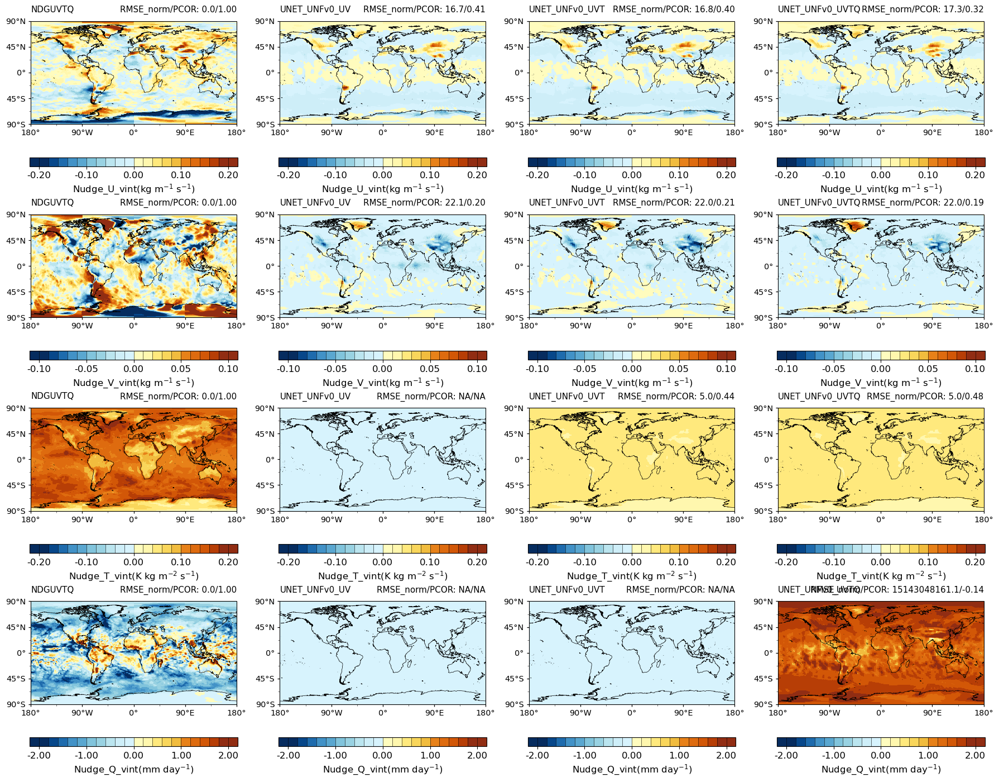

In [25]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_UNFv0" 
    exp_mtag  = "UNET{}_UNFv0" 
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{}_UNFv1 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_UNFv1_UV RMSE_norm/PCOR: 18.5/0.15
Nudge_U_vint UNET_UNFv1_UVT RMSE_norm/PCOR: 18.4/0.17
Nudge_U_vint UNET_UNFv1_UVTQ RMSE_norm/PCOR: 18.3/0.14
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_UNFv1_UV RMSE_norm/PCOR: 22.2/0.17
Nudge_V_vint UNET_UNFv1_UVT RMSE_norm/PCOR: 22.1/0.18
Nudge_V_vint UNET_UNFv1_UVTQ RMSE_norm/PCOR: 22.2/0.13
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_UNFv1_UV RMS

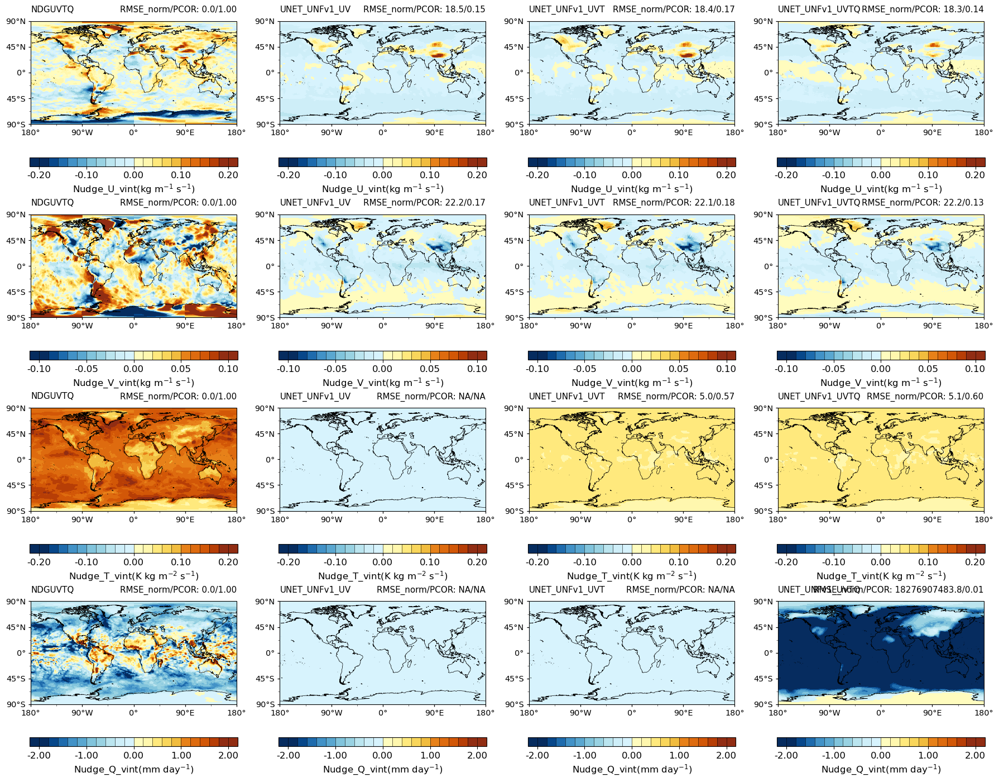

In [26]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_UNFv1" # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}_UNFv1" # u,v,t,q, no spacial treatment 
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{}_UNFv2 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_UNFv2_UV RMSE_norm/PCOR: 71.5/0.07
Nudge_U_vint UNET_UNFv2_UVT RMSE_norm/PCOR: 71.4/0.07
Nudge_U_vint UNET_UNFv2_UVTQ RMSE_norm/PCOR: 71.4/0.08
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_UNFv2_UV RMSE_norm/PCOR: 261.4/-0.02
Nudge_V_vint UNET_UNFv2_UVT RMSE_norm/PCOR: 260.9/-0.02
Nudge_V_vint UNET_UNFv2_UVTQ RMSE_norm/PCOR: 260.9/-0.02
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_UNFv2_

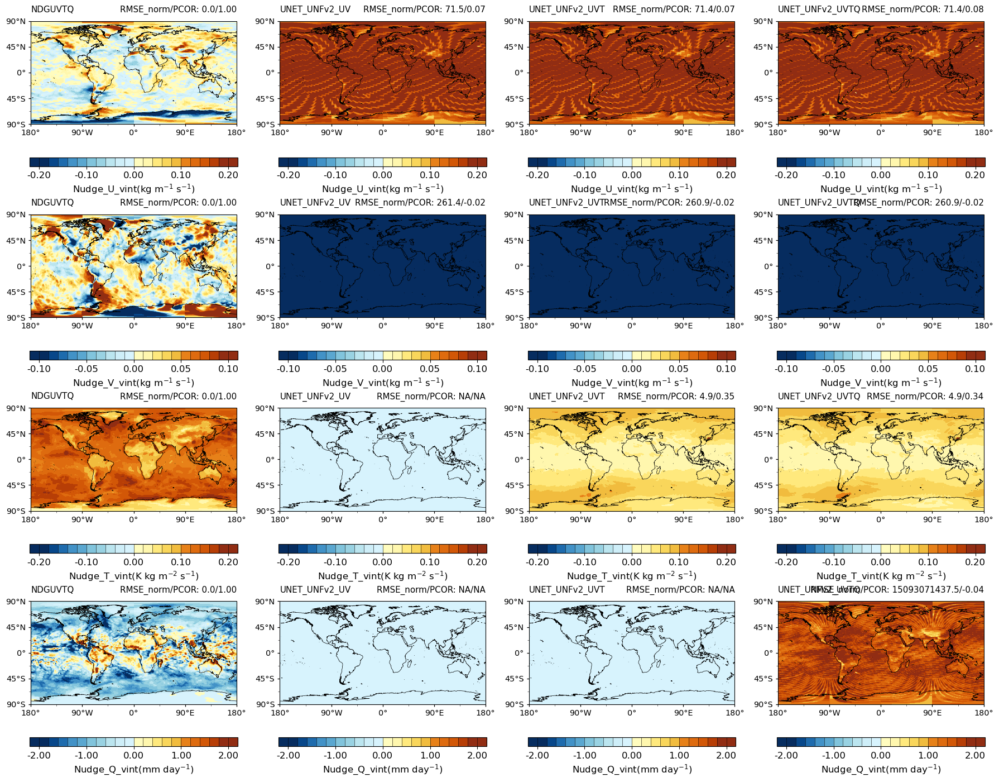

In [27]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam    = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_UNFv2" 
    exp_mtag  = "UNET{}_UNFv2"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{}_UNFv2.1 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_UNFv2.1_UV RMSE_norm/PCOR: 16.2/0.47
Nudge_U_vint UNET_UNFv2.1_UVT RMSE_norm/PCOR: 15.7/0.51
Nudge_U_vint UNET_UNFv2.1_UVTQ RMSE_norm/PCOR: 15.7/0.52
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_UNFv2.1_UV RMSE_norm/PCOR: 21.0/0.34
Nudge_V_vint UNET_UNFv2.1_UVT RMSE_norm/PCOR: 20.9/0.35
Nudge_V_vint UNET_UNFv2.1_UVTQ RMSE_norm/PCOR: 20.8/0.36
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNE

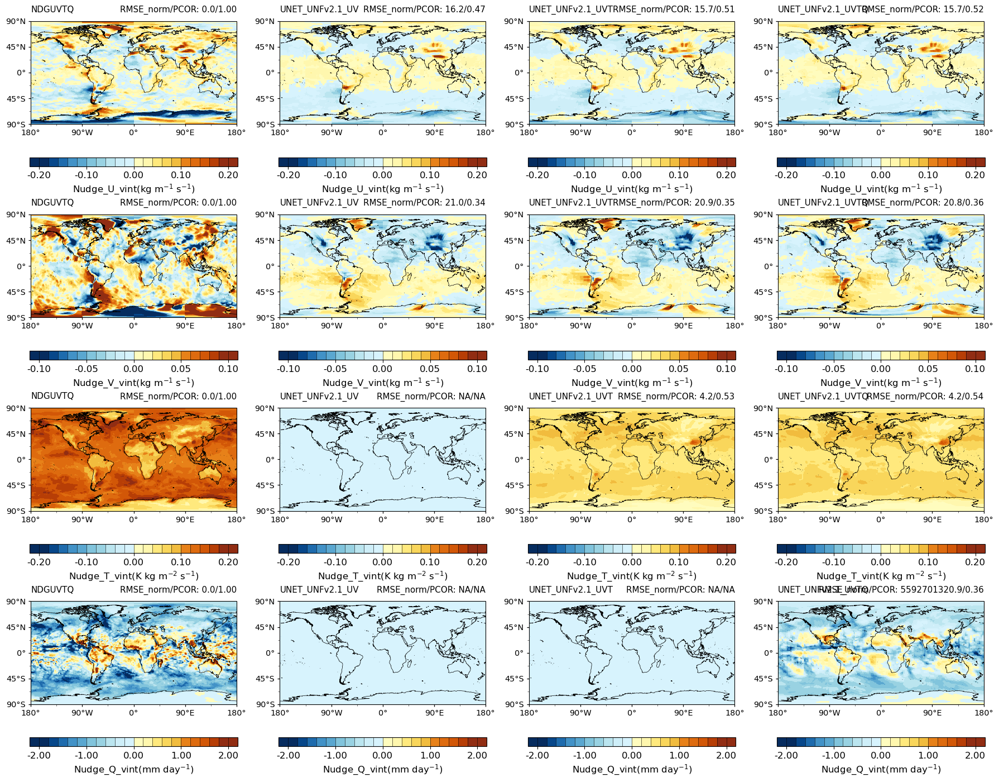

In [28]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam    = "global" #'Atlantic'
    exp_name  = 'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_UNFv2.1" # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}_UNFv2.1" # u,v,t,q, no spacial treatment 
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{}_UNFv2.2 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_UNFv2.2_map_UV RMSE_norm/PCOR: 17.0/0.40
Nudge_U_vint UNET_UNFv2.2_map_UVT RMSE_norm/PCOR: 18.4/0.39
Nudge_U_vint UNET_UNFv2.2_map_UVTQ RMSE_norm/PCOR: 17.9/0.43
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_UNFv2.2_map_UV RMSE_norm/PCOR: 22.6/0.18
Nudge_V_vint UNET_UNFv2.2_map_UVT RMSE_norm/PCOR: 22.6/0.16
Nudge_V_vint UNET_UNFv2.2_map_UVTQ RMSE_norm/PCOR: 22.3/0.20
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0

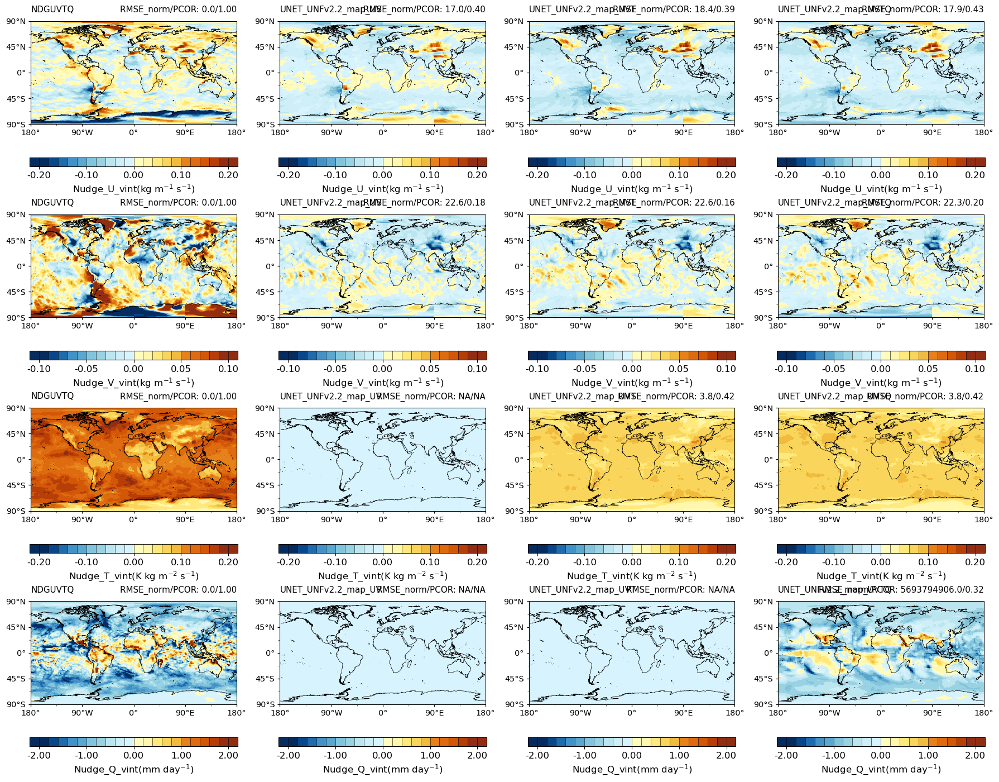

In [21]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_UNFv2.2_map" # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}_UNFv2.2" # u,v,t,q, no spacial treatment 
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 RUNET{}_UNFv0 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint RUNET_UNFv0_UV RMSE_norm/PCOR: 17.1/0.48
Nudge_U_vint RUNET_UNFv0_UVT RMSE_norm/PCOR: 16.6/0.48
Nudge_U_vint RUNET_UNFv0_UVTQ RMSE_norm/PCOR: 16.6/0.48
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint RUNET_UNFv0_UV RMSE_norm/PCOR: 22.7/0.19
Nudge_V_vint RUNET_UNFv0_UVT RMSE_norm/PCOR: 22.7/0.18
Nudge_V_vint RUNET_UNFv0_UVTQ RMSE_norm/PCOR: 22.9/0.17
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint RUNET_UNFv

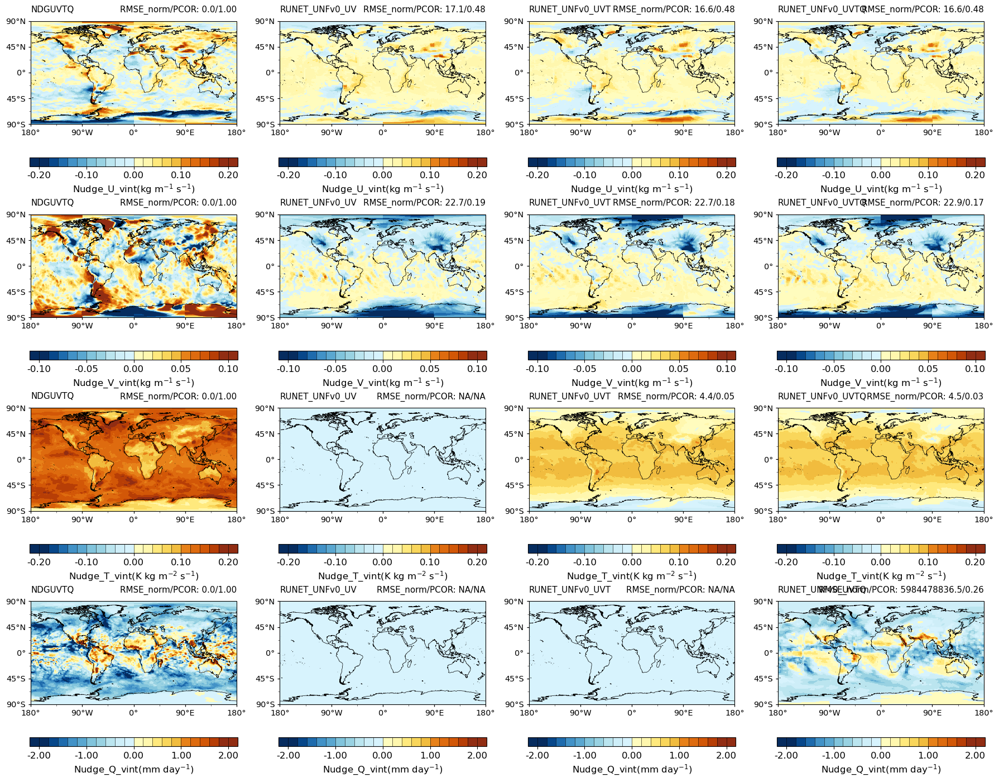

In [29]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam    = "global" #'Atlantic'
    exp_name  = 'Sandy'
    exp_year  = 2012
    exp_mstr  = "RUNET_UNFv0" # u,v,t,q, no spacial treatment 
    exp_mtag  = "RUNET{}_UNFv0" # u,v,t,q, no spacial treatment 
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 IUNET{}_UNFv0 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint IUNET_SEPv1_UV RMSE_norm/PCOR: 17.6/0.54
Nudge_U_vint IUNET_SEPv1_UVT RMSE_norm/PCOR: 19.8/0.52
Nudge_U_vint IUNET_SEPv1_UVTQ RMSE_norm/PCOR: 21.3/0.52
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint IUNET_SEPv1_UV RMSE_norm/PCOR: 21.7/0.47
Nudge_V_vint IUNET_SEPv1_UVT RMSE_norm/PCOR: 24.4/0.48
Nudge_V_vint IUNET_SEPv1_UVTQ RMSE_norm/PCOR: 25.8/0.46
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint IUNET_SEPv

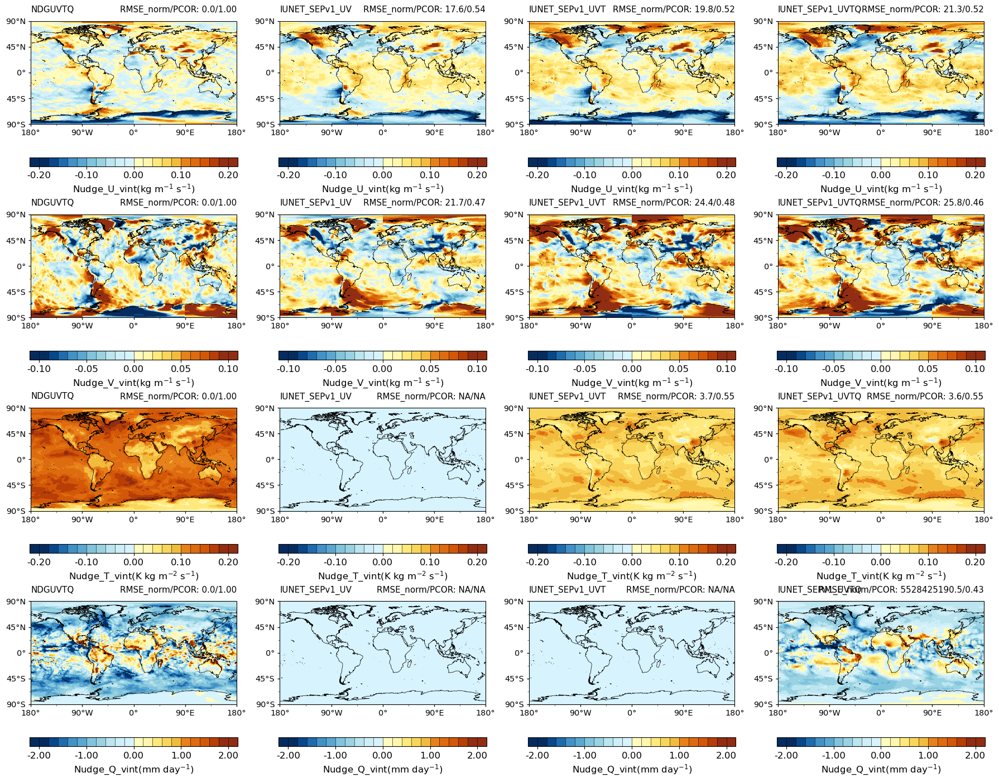

In [30]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "IUNET_SEPv1"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "IUNET{}_UNFv0"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{} 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_SEPv0_UV RMSE_norm/PCOR: 14.8/0.59
Nudge_U_vint UNET_SEPv0_UVT RMSE_norm/PCOR: 14.4/0.61
Nudge_U_vint UNET_SEPv0_UVTQ RMSE_norm/PCOR: 14.6/0.60
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_SEPv0_UV RMSE_norm/PCOR: 20.2/0.47
Nudge_V_vint UNET_SEPv0_UVT RMSE_norm/PCOR: 19.9/0.46
Nudge_V_vint UNET_SEPv0_UVTQ RMSE_norm/PCOR: 19.5/0.49
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_SEPv0_UV RMSE_norm

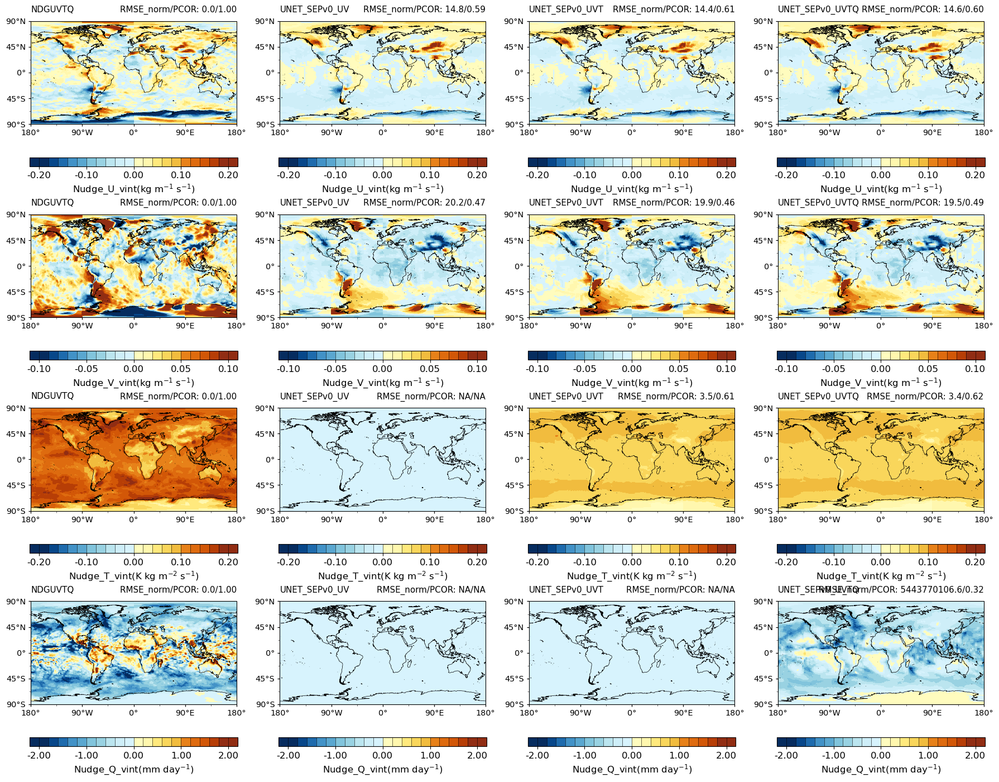

In [32]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_SEPv0"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)

working on  Sandy 2012 UNET{}_Layer 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_Layer_UV RMSE_norm/PCOR: 14.6/0.60
Nudge_U_vint UNET_Layer_UVT RMSE_norm/PCOR: 14.7/0.60
Nudge_U_vint UNET_Layer_UVTQ RMSE_norm/PCOR: 19.9/0.05
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_Layer_UV RMSE_norm/PCOR: 20.6/0.43
Nudge_V_vint UNET_Layer_UVT RMSE_norm/PCOR: 20.7/0.42
Nudge_V_vint UNET_Layer_UVTQ RMSE_norm/PCOR: 29.1/0.11
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_Layer_UV RMS

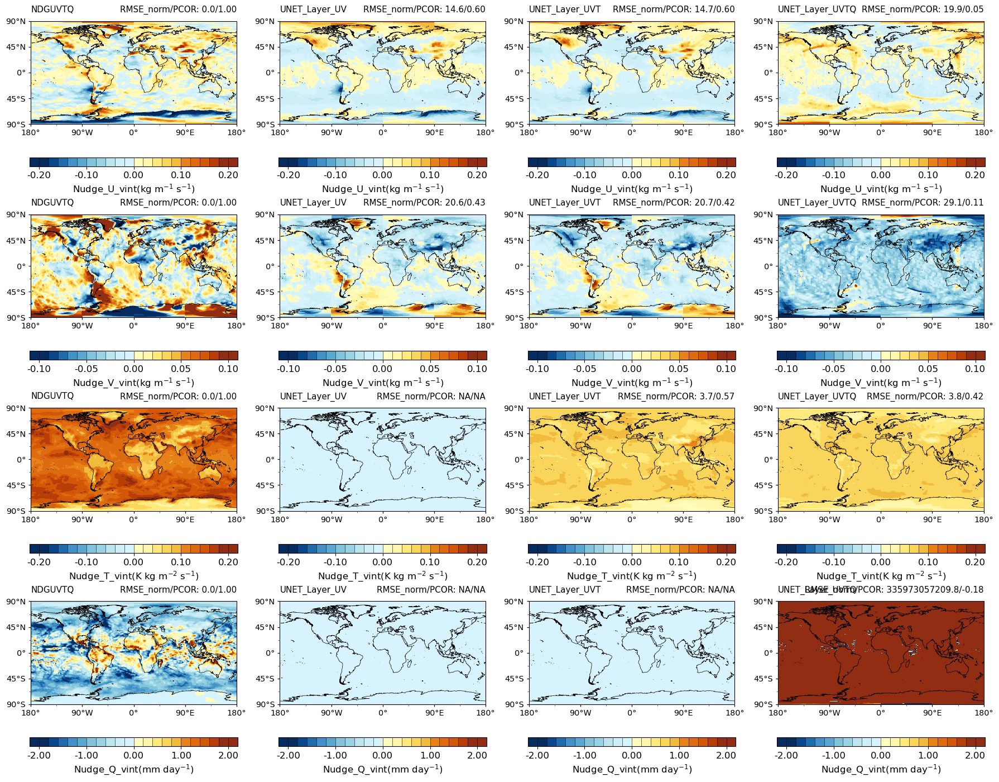

In [33]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_Layer"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}_Layer"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)
    

working on  Sandy 2012 UNET{}_SCALv0 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint UNET_SCALv0_UV RMSE_norm/PCOR: 18.2/0.17
Nudge_U_vint UNET_SCALv0_UVT RMSE_norm/PCOR: 18.2/0.17
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint UNET_SCALv0_UV RMSE_norm/PCOR: 22.2/0.08
Nudge_V_vint UNET_SCALv0_UVT RMSE_norm/PCOR: 22.2/0.08
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint UNET_SCALv0_UV RMSE_norm/PCOR: NA/NA
Nudge_T_vint UNET_SCALv0_UVT RMSE_norm/PCOR: 3.9/0.47
obs: <xarray.DataArray 'Nudge_Q

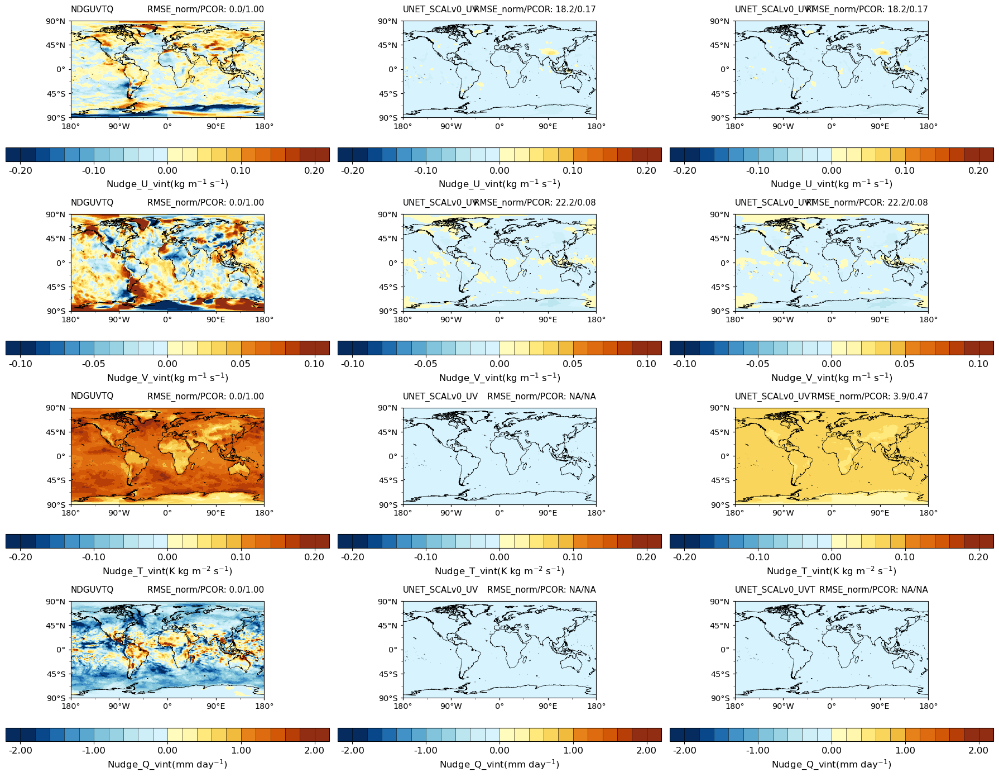

In [35]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "UNET_SCALv0"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "UNET{}_SCALv0"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 #'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)
    

working on  Sandy 2012 VITO{} 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint VITO_UNFv0_UV RMSE_norm/PCOR: 15.2/0.59
Nudge_U_vint VITO_UNFv0_UVT RMSE_norm/PCOR: 15.1/0.60
Nudge_U_vint VITO_UNFv0_UVTQ RMSE_norm/PCOR: 15.2/0.59
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint VITO_UNFv0_UV RMSE_norm/PCOR: 20.4/0.40
Nudge_V_vint VITO_UNFv0_UVT RMSE_norm/PCOR: 20.3/0.41
Nudge_V_vint VITO_UNFv0_UVTQ RMSE_norm/PCOR: 20.2/0.42
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint VITO_UNFv0_UV RMSE_norm

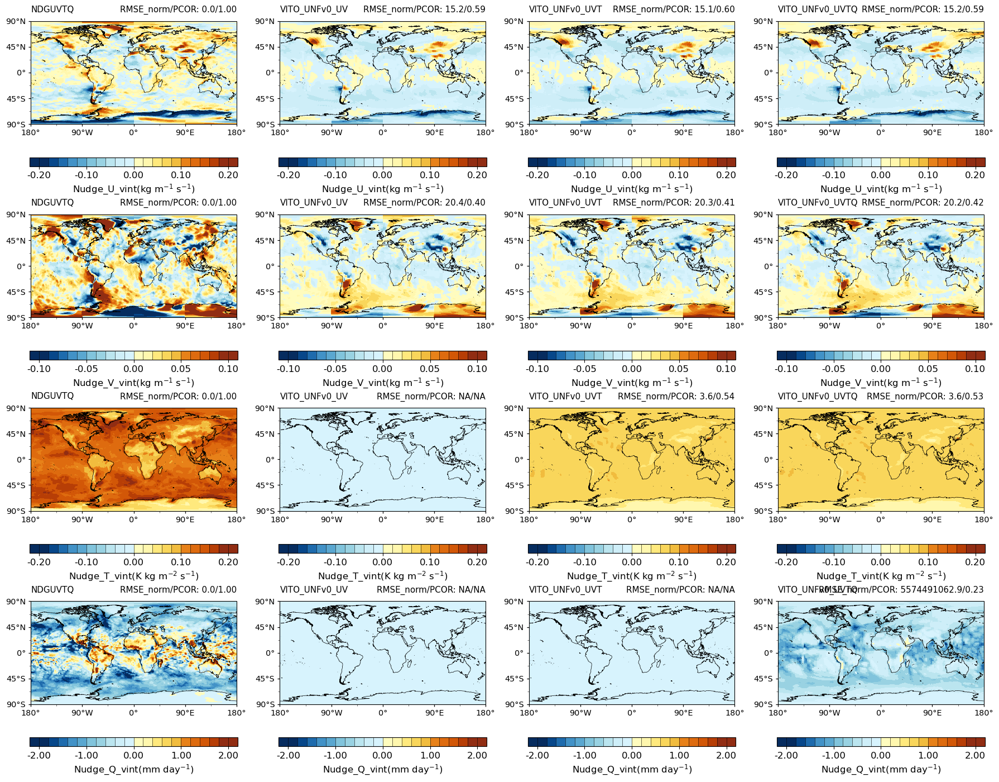

In [36]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "VITO_UNFv0"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "VITO{}"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':                            'NDGUVTQ',
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UV')):   '{}_{}'.format(exp_mstr,'UV'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVT')):  '{}_{}'.format(exp_mstr,'UVT'),
                 'SANDY2012_{}_F20TR_ne30pg2_EC30to60E2r2_pm-cpu'.format(exp_mtag.format('UVTQ')): '{}_{}'.format(exp_mstr,'UVTQ')
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)
    

working on  Sandy 2012 VITO{} 2012-10-22-2012-11-05
region: (-90, 90) (0, 360)
obs: <xarray.DataArray 'Nudge_U_vint' (time: 1)> Size: 8B
array([0.00296967])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_U_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_U_vint NDGUV RMSE_norm/PCOR: 12.5/0.79
Nudge_U_vint NDGUVT RMSE_norm/PCOR: 4.6/0.97
obs: <xarray.DataArray 'Nudge_V_vint' (time: 1)> Size: 8B
array([0.00203956])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_V_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_V_vint NDGUV RMSE_norm/PCOR: 17.8/0.74
Nudge_V_vint NDGUVT RMSE_norm/PCOR: 7.0/0.95
obs: <xarray.DataArray 'Nudge_T_vint' (time: 1)> Size: 8B
array([0.01666868])
Coordinates:
  * time     (time) object 8B 2012-10-29 00:00:00
Nudge_T_vint NDGUVTQ RMSE_norm/PCOR: 0.0/1.00
Nudge_T_vint NDGUV RMSE_norm/PCOR: 12.7/0.70
Nudge_T_vint NDGUVT RMSE_norm/PCOR: 1.6/0.90
obs: <xarray.DataArray 'Nudge_Q_vint' (time: 1)> Size: 8B
array([1.51109585e-10])
Coordina

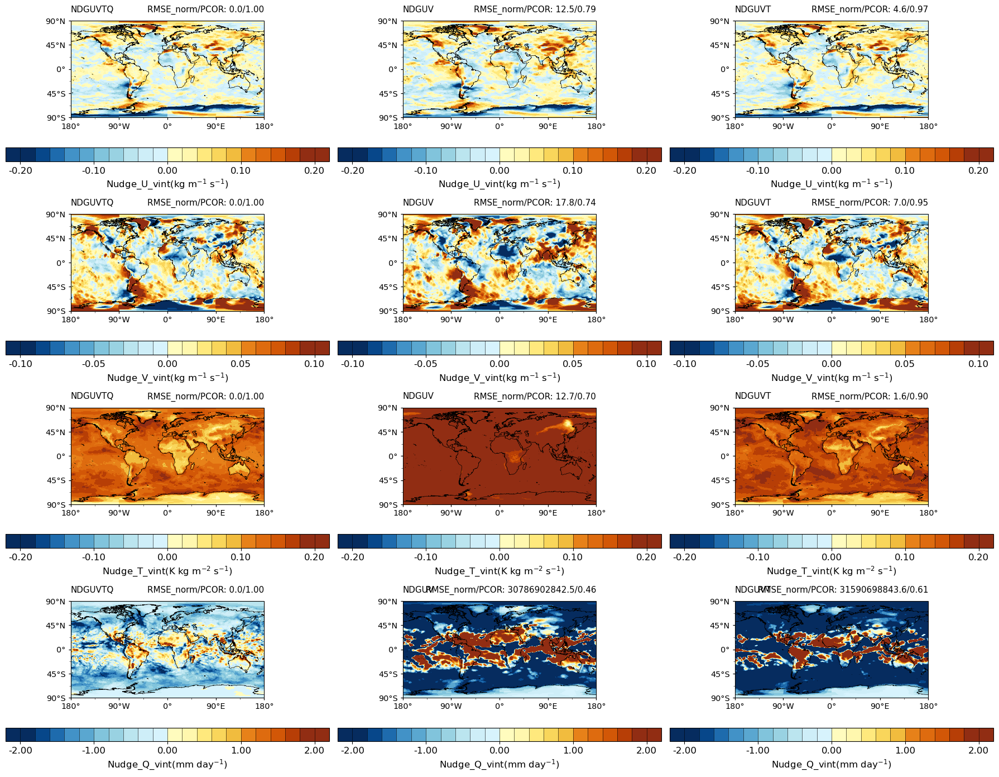

In [37]:
if __name__ == "__main__":
    top_path  = "/pscratch/sd/z/zhan391/SEACROGS_project"
    out_path  = os.path.join(top_path,"paper_material","fig_data","storm_track")
    fig_path  = os.path.join(top_path,"paper_material","case_study","storm_track","figures")

    # region of interest (north Atlantic)
    regnam = "global" #'Atlantic'
    exp_name  =  'Sandy'
    exp_year  = 2012
    exp_mstr  = "VITO_UNFv0"   # u,v,t,q, no spacial treatment 
    exp_mtag  = "VITO{}"  
    period    = "2012-10-22-2012-11-05"
    frequency = "3hourly"
    exps      = {'SANDY2012_NDGUVTQ_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':         'NDGUVTQ',
                 'SANDY2012_NDGUV_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':           'NDGUV',
                 'SANDY2012_NDGUVT_F20TR_ne30pg2_EC30to60E2r2_pm-cpu':          'NDGUVT',
                }
    data_path_template  = "/pscratch/sd/z/zhan391/seacrogs_scratch/%(CASENAME)/EN00/post/atm/180x360_aave/clim"
    hist_tag = "eam.h2"
    print("working on ",exp_name,exp_year,exp_mtag,period)
    draw_2d_map(exp_name,exp_year,exp_mstr,hist_tag,period,frequency,regnam,data_path_template,fig_path,out_path)
    